# Visualization Variant Painting Images and Cells

In [26]:
import os
import glob
import polars as pl
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage.io import imread
from tqdm import tqdm
import re
import sys
import subprocess
from plot_utils import *

sys.path.append("../../../2_analyses/1_snakemake_pipeline/2025_varchamp_snakemake/1.image_preprocess_qc/scripts/")
from img_utils import *
# %matplotlib inline

PLATEMAP_DIR = "../../../1_inputs/1_snakemake_pipeline/inputs/metadata/platemaps/{batch_id}/platemap"
TIFF_IMGS_DIR = "../../../2_analyses/1_snakemake_pipeline/2025_varchamp_snakemake/1.image_preprocess_qc/inputs/cpg_imgs"

## 1. Loading meta data and variant classification

In [2]:
BIO_REP_BATCHES_DICT = {
    # "2024_01_Batch_7-8": ("2024_01_23_Batch_7", "2024_02_06_Batch_8"),
    # "2024_12_Batch_11-12": ("2024_12_09_Batch_11", "2024_12_09_Batch_12"),
    # "2025_03_Batch_15-16": ("2025_03_17_Batch_15", "2025_03_17_Batch_16"),
    "2025_06_Batch_18-19": ("2025_06_10_Batch_18", "2025_06_10_Batch_19"),
    "2025_01_Batch_13-14": ("2025_01_27_Batch_13", "2025_01_28_Batch_14")
}

# BIO_REP_BATCHES = ["2025_01_27_Batch_13", "2025_01_28_Batch_14"]
# COMBINED_BIO_REP_DIR = "2025_01_Batch_13-14"
# BIO_REP_BATCHES = ["2025_06_10_Batch_18", "2025_06_10_Batch_19"]
# COMBINED_BIO_REP_DIR = "2025_06_Batch_18-19"

### 1.1 Read in the meta data

In [3]:
allele_meta_dict = {}
for batch_bio_rep, batch_ids in BIO_REP_BATCHES_DICT.items():
    for batch_id in batch_ids:
        allele_meta_df = pl.DataFrame()
        for platemap in os.listdir(PLATEMAP_DIR.format(batch_id=batch_id)):
            if "ipy" in platemap:
                continue
            platemap_df = pl.read_csv(os.path.join(PLATEMAP_DIR.format(batch_id=batch_id), platemap), separator="\t", infer_schema_length=100000)
            allele_meta_df = pl.concat([allele_meta_df, 
                                        platemap_df.filter((pl.col("node_type").is_not_null()))], # (~pl.col("node_type").is_in(["TC","NC","PC"]))&
                                        how="diagonal_relaxed").sort("plate_map_name")
            allele_meta_df = allele_meta_df.with_columns(pl.col("plate_map_name").str.split('_').list.get(0).alias("plate_map"))
        allele_meta_dict[batch_id] = allele_meta_df

In [5]:
img_sum_stat_df = pl.DataFrame()
for batch_bio_rep, batch_ids in BIO_REP_BATCHES_DICT.items():
    sum_stats_dir = f"../../../3_outputs/1_snakemake_pipeline/3.smp_results_analyses/3.classification_analyses/{batch_bio_rep}"
    img_sum_stat_df = pl.concat([img_sum_stat_df, pl.read_csv(f"{sum_stats_dir}/imaging_analyses_classification_summary.csv")])
img_sum_stat_df

gene_allele,Metadata_Bio_Batch,AUROC_BioRep1_Morph,AUROC_BioRep1_AGP,AUROC_BioRep1_GFP,AUROC_BioRep1_Mito,AUROC_BioRep1_DNA,AUROC_BioRep2_Morph,AUROC_BioRep2_AGP,AUROC_BioRep2_GFP,AUROC_BioRep2_Mito,AUROC_BioRep2_DNA,AUROC_Mean_Morph,AUROC_Mean_AGP,AUROC_Mean_GFP,AUROC_Mean_Mito,AUROC_Mean_DNA,Altered_95th_perc_Morph,Altered_95th_perc_AGP,Altered_95th_perc_GFP,Altered_95th_perc_Mito,Altered_95th_perc_DNA,Altered_99th_perc_Morph,Altered_99th_perc_AGP,Altered_99th_perc_GFP,Altered_99th_perc_Mito,Altered_99th_perc_DNA,Gene
str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str
"""GBA_ALA59THR""","""2025_06_Batch_18-19""",0.890738,0.838395,0.84098,0.938644,0.6464,0.895556,0.895369,0.927826,0.898916,0.775508,0.893147,0.866882,0.884403,0.91878,0.710954,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""GBA"""
"""PDIA2_Pro69Ser""","""2025_06_Batch_18-19""",0.99173,0.986246,null,0.965499,0.942461,0.949902,0.946125,null,0.937548,0.873985,0.970816,0.966186,null,0.951523,0.908223,1.0,1.0,null,0.0,1.0,0.0,0.0,null,0.0,0.0,"""PDIA2"""
"""CCM2_Leu198Arg""","""2025_06_Batch_18-19""",0.898164,0.915724,0.915482,0.904907,0.698855,0.850845,0.897044,0.900514,0.900457,0.667435,0.874504,0.906384,0.907998,0.902682,0.683145,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""CCM2"""
"""GBA_ALA348GLY""","""2025_06_Batch_18-19""",0.497601,0.755256,0.647738,0.629088,0.478463,0.531021,0.635523,0.728867,0.658259,0.45352,0.514311,0.69539,0.688302,0.643673,0.465991,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""GBA"""
"""COX10_Arg409Trp""","""2025_06_Batch_18-19""",0.463356,0.625622,0.673848,0.596599,0.460762,0.688227,0.666477,0.708484,0.706596,0.625211,0.575791,0.64605,0.691166,0.651598,0.542987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""COX10"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""RAF1_Leu613Val""","""2025_01_Batch_13-14""",0.76246,0.736416,0.796199,0.778861,0.684843,null,null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAF1"""
"""ABCD1_Arg389Gly""","""2025_01_Batch_13-14""",0.557768,0.688767,0.727045,0.660332,0.543234,0.874137,0.752903,0.729378,0.888988,0.740027,0.715952,0.720835,0.728212,0.77466,0.641631,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""ABCD1"""
"""CCM2_Asp61Asn""","""2025_01_Batch_13-14""",0.835132,0.854073,0.878034,0.869844,0.782457,0.803768,0.799043,0.869585,0.778494,0.79149,0.81945,0.826558,0.873809,0.824169,0.786974,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""CCM2"""


In [6]:
# img_sum_stat_df = pl.read_csv("../../../3_outputs/2_results_summary/CCM2/CCM2_allele_image_results.csv")
# img_sum_stat_df = pl.read_csv("../../../3_outputs/2_results_summary/CCM2/CCM2_allele_image_results.csv")
# img_sum_stat_df

In [7]:
img_well_qc_sum = pl.DataFrame()
for batch_bio_rep, batch_ids in BIO_REP_BATCHES_DICT.items():
    img_qc_dir = f"../../../3_outputs/1_snakemake_pipeline/3.smp_results_analyses/1.image_qc_outputs/{batch_bio_rep}"
    if img_well_qc_sum.is_empty():
        img_well_qc_sum = pl.read_csv(f"{img_qc_dir}/plate-well-level_img_qc_sum.csv")
    else:
        img_well_qc_sum_batch = pl.read_csv(f"{img_qc_dir}/plate-well-level_img_qc_sum.csv")
        select_cols = set(img_well_qc_sum.columns).intersection(img_well_qc_sum_batch.columns)
        img_well_qc_sum = pl.concat([img_well_qc_sum.select(select_cols), img_well_qc_sum_batch.select(select_cols)])
img_well_qc_sum

std,node_type,nt_change_cdna,clinvar_allele_ID,plate_well,perc_90_plate,is_bg,perc_95_plate,perc_95,mean,aa_change,mean_plate,perc_25,std_plate,plate_id,gene_allele,well,imaging_well,plate,median_plate,perc_99,perc_80_plate,perc_80,perc_99_plate,plate_map_name,imaging_plate_R1,ccsb_mutation_id,perc_75_plate,s2n_ratio,perc_90,perc_25_plate,orf_id_wt,well_position,channel,symbol,hgmd_ID,s2n_threshold,clinvar_clinical_significance,imaging_plate_R2,perc_75,perc_50
f64,str,str,str,str,i64,bool,i64,i64,f64,str,f64,i64,f64,str,str,str,str,str,i64,i64,i64,i64,i64,str,str,str,i64,f64,i64,i64,f64,str,str,str,str,f64,str,str,i64,i64
62.304389,"""TC""",null,null,"""B18A8A10R1_P1-F05""",243,true,548,213,176.84766,null,220.466605,158,163.732558,"""B18A8A10R1_P1""","""eGFP""","""F05""","""F05""","""2025_05_28_B18A8A10R1_P1T1""",185,224,212,198,869,"""B18A8A10R1_P1""","""B18A8A10R1_P1""",null,206,1.417722,206,164,null,"""F05""","""DAPI""","""eGFP""",null,1.514733,null,"""B19A8A10R1_P1""",194,177
81.352018,"""TC""",null,null,"""B18A8A10R1_P1-E05""",243,true,548,216,180.020479,null,220.466605,160,163.732558,"""B18A8A10R1_P1""","""eGFP""","""E05""","""E05""","""2025_05_28_B18A8A10R1_P1T1""",185,228,212,200,869,"""B18A8A10R1_P1""","""B18A8A10R1_P1""",null,206,1.425,209,164,null,"""E05""","""DAPI""","""eGFP""",null,1.514733,null,"""B19A8A10R1_P1""",197,179
69.887227,"""TC""",null,null,"""B18A8A10R1_P1-E06""",243,true,548,216,179.479366,null,220.466605,160,163.732558,"""B18A8A10R1_P1""","""eGFP""","""E06""","""E06""","""2025_05_28_B18A8A10R1_P1T1""",185,228,212,201,869,"""B18A8A10R1_P1""","""B18A8A10R1_P1""",null,206,1.425,209,164,null,"""E06""","""DAPI""","""eGFP""",null,1.514733,null,"""B19A8A10R1_P1""",197,179
71.028036,"""allele""","""695G>A""",null,"""B18A8A10R1_P1-G04""",243,true,548,211,176.60829,"""GLY232GLU""",220.466605,157,163.732558,"""B18A8A10R1_P1""","""GBA_GLY232GLU""","""G04""","""G04""","""2025_05_28_B18A8A10R1_P1T1""",185,224,212,196,869,"""B18A8A10R1_P1""","""B18A8A10R1_P1""","""CCSBVarC038958""",206,1.426752,205,164,2.0,"""G04""","""DAPI""","""GBA""",null,1.514733,null,"""B19A8A10R1_P1""",193,176
68.965681,"""TC""",null,null,"""B18A8A10R1_P1-F06""",243,true,548,217,179.977101,null,220.466605,160,163.732558,"""B18A8A10R1_P1""","""eGFP""","""F06""","""F06""","""2025_05_28_B18A8A10R1_P1T1""",185,229,212,201,869,"""B18A8A10R1_P1""","""B18A8A10R1_P1""",null,206,1.43125,210,164,null,"""F06""","""DAPI""","""eGFP""",null,1.514733,null,"""B19A8A10R1_P1""",198,180
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
1075.976928,"""PC""",null,null,"""B14A7A8P2-G07""",1705,false,2624,3173,957.72281,null,852.191422,446,932.470109,"""B14A7A8P2""","""ALK""","""G07""","""G07""","""2025_01_28_B14A7A8P2_T4""",572,5493,857,1224,4783,"""B14A7A8P2_R2""","""B13A7A8P2_R1""",""" """,699,12.316143,2237,478,null,"""G07""","""Mito""","""ALK""",null,1.756779,null,"""B14A7A8P2_R2""",936,548
1906.543146,"""allele""","""781C>T""",null,"""B14A7A8P2-I11""",1705,false,2624,2792,902.209848,"""Pro261Ser""",852.191422,456,932.470109,"""B14A7A8P2""","""RAF1_Pro261Ser""","""I11""","""I11""","""2025_01_28_B14A7A8P2_T4""",572,5667,857,687,4783,"""B14A7A8P2_R2""","""B13A7A8P2_R1""","""CCSBVarC008859""",699,12.427632,1714,478,732.0,"""I11""","""Mito""","""RAF1""",null,1.756779,null,"""B14A7A8P2_R2""",624,539
1722.366647,"""allele""","""788T>C""",null,"""B14A7A8P2-E13""",1705,false,2624,2845,921.015088,"""Val263Ala""",852.191422,476,932.470109,"""B14A7A8P2""","""RAF1_Val263Ala""","""E13""","""E13""","""2025_01_28_B14A7A8P2_T4""",572,5934,857,722,4783,"""B14A7A8P2_R2""","""B13A7A8P2_R1""","""CCSBVarC008881""",699,12.466387,1737,478,732.0,"""E13""","""Mito""","""RAF1""",null,1.756779,null,"""B14A7A8P2_R2""",659,566


## 2. Plot Variant Painting Well Images

In [8]:
OUT_IMG_DIR = "../../../3_outputs/1_snakemake_pipeline/2.sm_pipeline_outputs/visualize_imgs/{COMBINED_BIO_REP_DIR}"
# if not os.path.exists(out_imgs_dir):
#     os.makedirs(out_imgs_dir)

<Figure size 640x480 with 0 Axes>

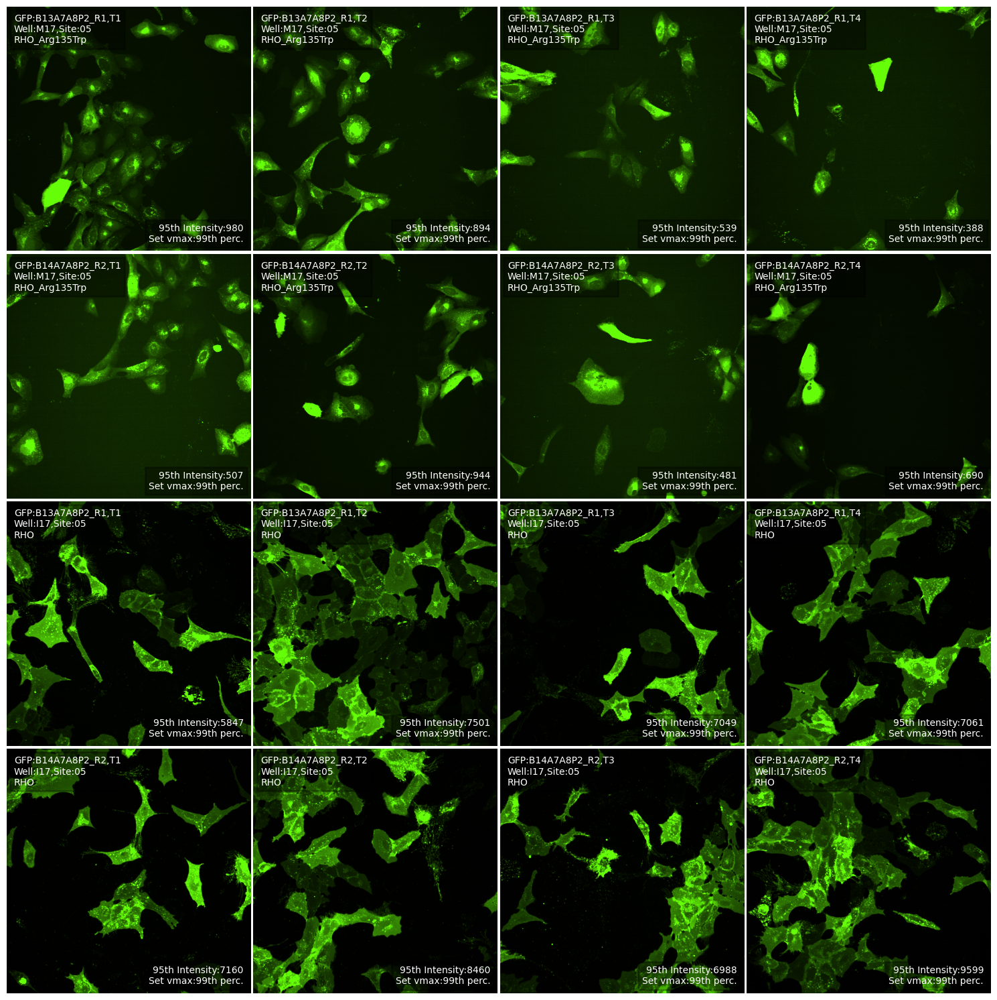

In [63]:
plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
            "RHO_Arg135Trp", "GFP", 
            auroc_df=img_sum_stat_df.with_columns(
                pl.col(f"AUROC_Mean_{channel_type}").alias("AUROC_Mean"),
                pl.col("gene_allele").alias("allele_0")
            ),
            plate_img_qc=img_well_qc_sum, 
            site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, 
            output_dir=OUT_IMG_DIR.format(COMBINED_BIO_REP_DIR="2025_01_Batch_13-14"))

In [64]:
# plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
#             "BRCA1_Met1Ile", "DAPI", auroc_df=local_wtvar, plate_img_qc=img_well_qc_sum, 
#             site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_IMG_DIR)

In [65]:
# plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
#             "BRCA1_Met1Ile", "Mito", auroc_df=local_wtvar, plate_img_qc=img_well_qc_sum, 
#             site="05", max_intensity=0.99, display=True, 
#             imgs_dir=TIFF_IMGS_DIR, 
#             output_dir="")

In [10]:
with pl.Config(tbl_rows=25):
    gene_alleles = allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("gene_allele").str.contains("RAD51D"))#["gene_allele"].unique()
    display(gene_alleles)

plate_map_name,well_position,symbol,gene_allele,imaging_well,imaging_plate_R1,imaging_plate_R2,node_type,orf_id_wt,ccsb_mutation_id,nt_change_cdna,aa_change,allele_set,imaging_plate,batch1,batch2,clone_ID,hgmd_ID,clinvar_allele_ID,clinvar_clinical_significance,vector,notes,plate,quad,c96,r96,r384,c384,r384_letter,plate_map
str,str,str,str,str,str,str,str,f64,str,str,str,f64,f64,f64,f64,str,str,str,str,f64,str,i64,i64,i64,i64,i64,i64,str,str
"""B13A7A8P1_R1""","""F24""","""RAD51D""","""RAD51D""","""F24""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""disease_wt""",7201.0,null,null,null,7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,4,12,3,6,24,"""F""","""B13A7A8P1"""
"""B13A7A8P1_R1""","""H24""","""RAD51D""","""RAD51D_Ser46Cys""","""H24""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7201.0,"""CCSBVarC024795""","""137C>G""","""Ser46Cys""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,4,12,4,8,24,"""H""","""B13A7A8P1"""
"""B13A7A8P1_R1""","""J24""","""RAD51D""","""RAD51D_Arg55Trp""","""J24""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7201.0,"""CCSBVarC024799""","""163C>T""","""Arg55Trp""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,4,12,5,10,24,"""J""","""B13A7A8P1"""
"""B13A7A8P1_R1""","""L24""","""RAD51D""","""RAD51D_Val56Gly""","""L24""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7201.0,"""CCSBVarC024801""","""167T>G""","""Val56Gly""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,4,12,6,12,24,"""L""","""B13A7A8P1"""
"""B13A7A8P1_R1""","""N24""","""RAD51D""","""RAD51D_Val66Met""","""N24""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7201.0,"""CCSBVarC024804""","""196G>A""","""Val66Met""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,4,12,7,14,24,"""N""","""B13A7A8P1"""
"""B13A7A8P1_R1""","""P24""","""RAD51D""","""RAD51D_Val66Leu""","""P24""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7201.0,"""CCSBVarC024807""","""196G>T""","""Val66Leu""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,4,12,8,16,24,"""P""","""B13A7A8P1"""
"""B13A7A8P2_R1""","""A01""","""RAD51D""","""RAD51D""","""A01""","""B13A7A8P2_R1""","""B14A7A8P2_R2""","""disease_wt""",7201.0,null,null,null,7.0,2.0,13.0,14.0,null,null,null,null,527.0,null,2,1,1,1,1,1,"""A""","""B13A7A8P2"""
"""B13A7A8P2_R1""","""C01""","""RAD51D""","""RAD51D_Cys9Ser""","""C01""","""B13A7A8P2_R1""","""B14A7A8P2_R2""","""allele""",7201.0,"""CCSBVarC024707""","""26G>C""","""Cys9Ser""",7.0,2.0,13.0,14.0,null,null,null,null,527.0,null,2,1,1,2,3,1,"""C""","""B13A7A8P2"""
"""B13A7A8P2_R1""","""E01""","""RAD51D""","""RAD51D_Val132Ile""","""E01""","""B13A7A8P2_R1""","""B14A7A8P2_R2""","""allele""",7201.0,"""CCSBVarC024822""","""394G>A""","""Val132Ile""",7.0,2.0,13.0,14.0,null,null,null,null,527.0,null,2,1,1,3,5,1,"""E""","""B13A7A8P2"""


In [14]:
for allele in tqdm(gene_alleles["gene_allele"].unique()):
    plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
                allele, "GFP", auroc_df=img_sum_stat_df.with_columns(
                    pl.col("AUROC_Mean_GFP").alias("AUROC_Mean"),
                    pl.col("gene_allele").alias("allele_0")
                ),
                plate_img_qc=img_well_qc_sum, ref_well=["A01"],
                site="05", max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR, 
                output_dir=OUT_IMG_DIR.format(COMBINED_BIO_REP_DIR="2025_01_Batch_13-14"))

100%|██████████| 21/21 [04:47<00:00, 13.70s/it]


In [33]:
allele_meta_dict["2025_06_10_Batch_18"].filter(
    pl.col("plate_map_name").str.contains("B18"),
    pl.col("gene_allele")=="CCM2_Val53Ile"
)

plate_map_name,well_position,symbol,gene_allele,source_plate,source_well,source_numb,dest_plate,dest_well,dest_numb,imaging_well,imaging_plate_R1,imaging_plate_R2,node_type,orf_id_wt,nt_change_cdna,aa_change,ccsb_mutation_id,hgmd_ID,clinvar_allele_ID,clinvar_clinical_significance,sequencing_confidence,plate_map
str,str,str,str,str,str,f64,str,str,f64,str,str,str,str,f64,str,str,str,str,str,str,str,str
"""B18A8A10R1_P2""","""M19""","""CCM2""","""CCM2_Val53Ile""","""Tube""",null,null,"""527_PD_Array_P05""","""G10""",79.0,"""M19""","""B18A8A10R1_P2""","""B19A8A10R1_P2""","""allele""",null,null,"""Val53Ile""",null,null,null,null,null,"""B18A8A10R1"""
"""B18A8A10R1_P2""","""C23""","""CCM2""","""CCM2_Val53Ile""","""Tube""",null,null,"""527_PD_Array_P05""","""B12""",90.0,"""C23""","""B18A8A10R1_P2""","""B19A8A10R1_P2""","""allele""",null,null,"""Val53Ile""",null,null,null,null,null,"""B18A8A10R1"""


<Figure size 640x480 with 0 Axes>

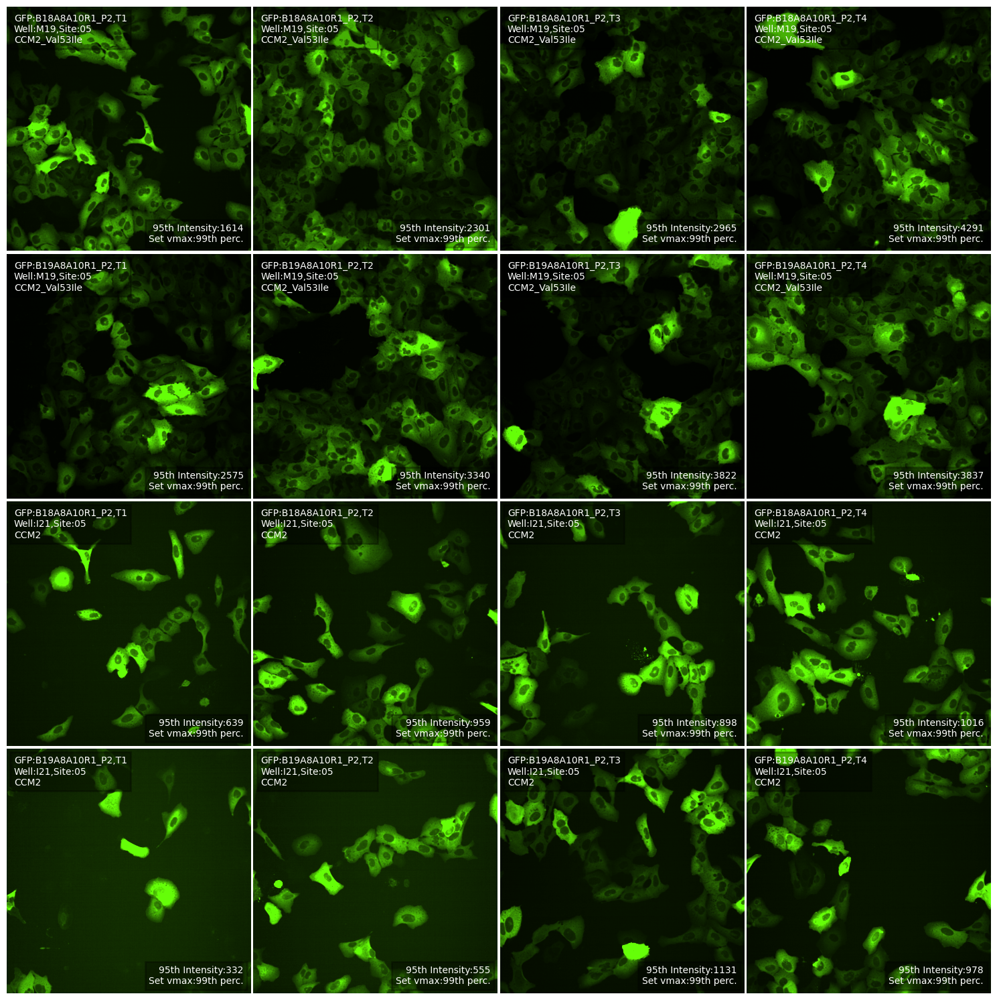

<Figure size 640x480 with 0 Axes>

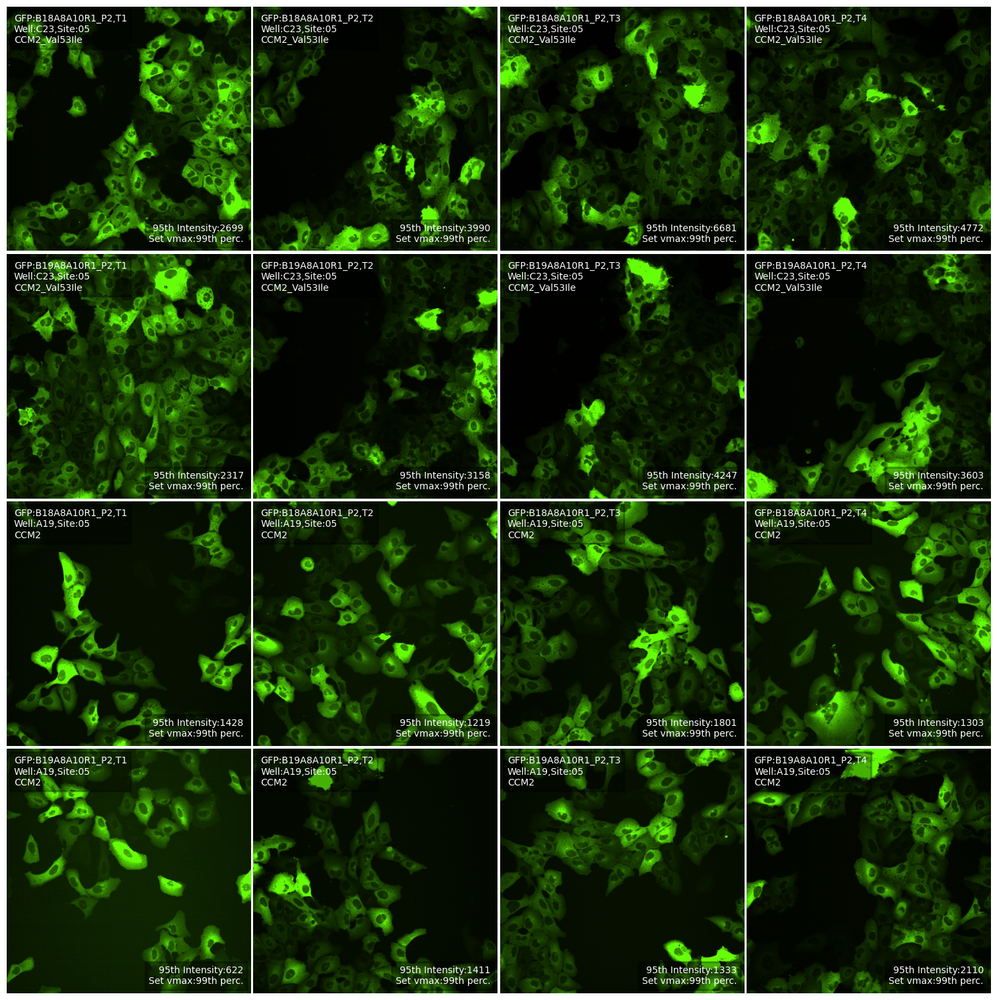

In [35]:
def plot_allele(pm, variant, sel_channel, plate_img_qc, auroc_df=None, site="05", ref_well=[], var_well=[], max_intensity=0.99, display=False, imgs_dir="", output_dir=""):
    assert imgs_dir != "", "Image directory has to be input!"
    plt.clf()
    cmap = channel_to_cmap(sel_channel)
    channel = channel_dict[sel_channel]
    if auroc_df is not None:
        auroc = auroc_df.filter(pl.col("allele_0")==variant)["AUROC_Mean"].mean()
    else:
        auroc = ""
    
    ## get the number of wells/images per allele
    plate_map = pm.filter(pl.col("gene_allele") == variant).select("plate_map_name").to_pandas().values.flatten()
    wt = variant.split("_")[0]
    wt_wells = pm.filter(pl.col("gene_allele") == wt).select("imaging_well").to_pandas().values.flatten()
    var_wells = pm.filter(pl.col("gene_allele") == variant).select("imaging_well").to_pandas().values.flatten()
    if ref_well:
        wt_wells = [well for well in wt_wells if well in ref_well]
    if var_well:
        var_wells = [well for well in var_wells if well in var_well]
    
    # if len(wt_wells) > 1:
    #     # Get coordinates of wells
    #     well_coords = [well_to_coordinates(w) for w in set([ref_well_pl for ref_well_pl in wt_wells])]
    #     # Sort wells by max distance from edges (descending)
    #     wt_wells = [max(well_coords, key=lambda x: compute_distance(x[1], x[2]))[0]]
    pm_var = pm.filter((pl.col("imaging_well").is_in(np.concatenate([wt_wells, var_wells])))&(pl.col("plate_map_name").is_in(plate_map))).sort("node_type")

    fig, axes = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, (len(wt_wells)+len(var_wells))*8), sharex=True, sharey=True)
    for wt_var, pm_row in enumerate(pm_var.iter_rows(named=True)):
        if "allele" in pm_row["node_type"]:
            if pm_row["node_type"] == "allele":
                well = var_wells[0]
                allele = variant
            else:
                well = wt_wells[0]
                allele = wt
        else:
            if pm_row["imaging_well"] in wt_wells:
                well = wt_wells[0]
                allele = wt
            else:
                well = var_wells[0]
                allele = variant

        for i in range(8):
            if i < 4:
                sel_plate = pm_row["imaging_plate_R1"]
            else:
                sel_plate = pm_row["imaging_plate_R2"]
                
            if "_" in sel_plate:
                batch_plate_map = sel_plate.split("_")[0]
            else:
                batch_plate_map = sel_plate
            
            batch = batch_dict[batch_plate_map]
            batch_img_dir = f'{imgs_dir}/{batch}/images'
            
            letter = well[0]
            row = letter_dict[letter]
            col = well[1:3]
            
            plate_img_dir = plate_dict[sel_plate][f"T{i%4+1}"]
            img_file = f"r{row}c{col}f{site}p01-ch{channel}sk1fk1fl1.tiff"

            # print(batch, well, plate_img_dir, img_file)
            # break

            if plate_img_qc is not None:
                is_bg = plate_img_qc.filter((pl.col("plate") == plate_img_dir.split("__")[0]) & (pl.col("well") == well) & (pl.col("channel") == sel_channel))["is_bg"].to_numpy()[0]
            if (os.path.exists(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}")):
                img = imread(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}", as_gray=True)
            else:
                # Define your S3 path and local destination
                s3_path = f's3://cellpainting-gallery/cpg0020-varchamp/broad/images/{batch}/images/{plate_img_dir}/Images/{img_file}'
                local_path = f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}"
                # Build the aws cli command
                cmd = ['aws', 's3', 'cp', '--no-sign-request', s3_path, local_path]
                # Execute the command using subprocess
                try:
                    subprocess.run(cmd, check=True)
                    print(f"Successfully downloaded from {s3_path} to {local_path}")
                except subprocess.CalledProcessError as e:
                    print(f"An error occurred: {e}")
                img = imread(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}", as_gray=True)
            
            plot_idx = i+wt_var*4*2
            # print(i, wt_var, plot_idx)
            axes.flatten()[plot_idx].imshow(img, vmin=0, vmax=np.percentile(img, max_intensity*100), cmap=cmap)
            plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
            axes.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
                    verticalalignment='top', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                    bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
            if is_bg:
                axes.flatten()[plot_idx].text(0.03, 0.03, "FLAG:\nOnly Background\nNoise is Detected", color='red', fontsize=10,
                    verticalalignment='bottom', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                    bbox=dict(facecolor='white', alpha=0.3, linewidth=2))
            int_95 = str(int(round(np.percentile(img, 95))))
            axes.flatten()[plot_idx].text(0.97, 0.03, f"95th Intensity:{int_95}\nSet vmax:{max_intensity*100:.0f}th perc.", color='white', fontsize=10,
                           verticalalignment='bottom', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                           bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
            axes.flatten()[plot_idx].axis("off")
        
    plt.tight_layout()
    plt.subplots_adjust(wspace=.01, hspace=-0.2, top=.99)
    
    if display:
        plt.show()
    file_name = f"{variant}_{sel_channel}"
    if auroc:
        file_name = f"{file_name}_{auroc:.3f}"
    if ref_well:
        file_name = f"{file_name}_REF-{ref_well[0]}"
    if var_well:
        file_name = f"{file_name}_VAR-{var_well[0]}"
        
    if output_dir:
        fig.savefig(os.path.join(output_dir, f"{file_name}.png"), dpi=400, bbox_inches='tight')
        plt.close(fig)


plot_allele(allele_meta_dict["2025_06_10_Batch_18"].filter(pl.col("plate_map_name").str.contains("B18")), 
                "CCM2_Val53Ile", "GFP", auroc_df=img_sum_stat_df.with_columns(
                    pl.col("AUROC_Mean_GFP").alias("AUROC_Mean"),
                    pl.col("gene_allele").alias("allele_0")
                ),
                plate_img_qc=img_well_qc_sum, 
                ref_well=["I21"],
                var_well=["M19"],
                site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, 
                output_dir=OUT_IMG_DIR.format(COMBINED_BIO_REP_DIR="2025_06_Batch_18-19"))

plot_allele(allele_meta_dict["2025_06_10_Batch_18"].filter(pl.col("plate_map_name").str.contains("B18")), 
                "CCM2_Val53Ile", "GFP", auroc_df=img_sum_stat_df.with_columns(
                    pl.col("AUROC_Mean_GFP").alias("AUROC_Mean"),
                    pl.col("gene_allele").alias("allele_0")
                ),
                plate_img_qc=img_well_qc_sum, 
                ref_well=["A19"],
                var_well=["C23"],
                site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, 
                output_dir=OUT_IMG_DIR.format(COMBINED_BIO_REP_DIR="2025_06_Batch_18-19"))

In [69]:
# for channel in ["DAPI", "Mito", "AGP"]:
#     for allele in ccm2_alleles["gene_allele"].unique():
#         channel_type = "DNA" if channel=="DAPI" else channel
#         plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
#                     allele, channel, auroc_df=img_sum_stat_df.with_columns(
#                         pl.col(f"AUROC_Mean_{channel_type}").alias("AUROC_Mean"),
#                         pl.col("gene_allele").alias("allele_0")
#                     ),
#                     plate_img_qc=img_well_qc_sum, ref_well=["M10"],
#                     site="05", max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR, 
#                     output_dir=OUT_IMG_DIR)

### 2.1 Output specific mislocalized alleles for investigation

In [14]:
# for allele in tqdm(local_wtvar.filter((pl.col("Altered_local_both_batches")))["allele_0"]):
#     print(allele)
#     try:
#         plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "GFP", auroc_df=local_wtvar, plate_img_qc=plate_img_qc, 
#                     site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)
#         print(allele)
#     except:
#         print(allele, "Failed")
#         continue

# for allele in tqdm(morph_wtvar.filter((pl.col("Altered_morph_both_batches")))["allele_0"]):
#     # print(allele)
#     plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "AGP", auroc_df=morph_wtvar, plate_img_qc=plate_img_qc, site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)
#     plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "Mito", auroc_df=morph_wtvar, plate_img_qc=plate_img_qc, site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)
#     plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "DAPI", auroc_df=morph_wtvar, plate_img_qc=plate_img_qc, site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)

## 3. Plot Cells

In [15]:
OUT_CELLS_DIR = "../../../3_outputs/1_snakemake_pipeline/2.sm_pipeline_outputs/visualize_cells/{COMBINED_BIO_REP_DIR}"
BATCH_PROFILES = "../../../3_outputs/1_snakemake_pipeline/2.sm_pipeline_outputs/batch_profiles/{}/profiles.parquet"
IMG_ANALYSIS_DIR = "../../../1_inputs/1_snakemake_pipeline/cpg_imgs/{}/analysis"

In [16]:
# Filter thresholds
min_area_ratio = 0.15
max_area_ratio = 0.3
min_center = 50
max_center = 1030
num_mad = 5
min_cells = 250

batch_profiles = {}
for batch_bio_rep, batch_ids in BIO_REP_BATCHES_DICT.items():
    for batch_id in batch_ids:
        print(batch_id)
        imagecsv_dir = IMG_ANALYSIS_DIR.format(batch_id)
        prof_path = BATCH_PROFILES.format(batch_id)
        
        # Get metadata
        profiles = pl.scan_parquet(prof_path).select(
            ["Metadata_well_position", "Metadata_plate_map_name", "Metadata_ImageNumber", "Metadata_ObjectNumber",
            "Metadata_symbol", "Metadata_gene_allele", "Metadata_node_type", "Metadata_Plate",
            "Nuclei_AreaShape_Area", "Cells_AreaShape_Area", "Nuclei_AreaShape_Center_X", "Nuclei_AreaShape_Center_Y",
            "Cells_AreaShape_BoundingBoxMaximum_X", "Cells_AreaShape_BoundingBoxMaximum_Y", "Cells_AreaShape_BoundingBoxMinimum_X",
            "Cells_AreaShape_BoundingBoxMinimum_Y",	"Cells_AreaShape_Center_X",	"Cells_AreaShape_Center_Y",
            "Cells_Intensity_MeanIntensity_GFP", "Cells_Intensity_MedianIntensity_GFP", "Cells_Intensity_IntegratedIntensity_GFP"],
        ).collect()
        # print(profiles["Metadata_Plate"])
        # break
    
        # Filter based on cell to nucleus area
        profiles = profiles.with_columns(
                        (pl.col("Nuclei_AreaShape_Area")/pl.col("Cells_AreaShape_Area")).alias("Nucleus_Cell_Area"),
                        pl.concat_str([
                            "Metadata_Plate", "Metadata_well_position", "Metadata_ImageNumber", "Metadata_ObjectNumber",
                            ], separator="_").alias("Metadata_CellID"),
                ).filter((pl.col("Nucleus_Cell_Area") > min_area_ratio) & (pl.col("Nucleus_Cell_Area") < max_area_ratio))
    
        # Filter cells too close to image edge
        profiles = profiles.filter(
            ((pl.col("Nuclei_AreaShape_Center_X") > min_center) & (pl.col("Nuclei_AreaShape_Center_X") < max_center) &
            (pl.col("Nuclei_AreaShape_Center_Y") > min_center) & (pl.col("Nuclei_AreaShape_Center_Y") < max_center)),
        )
    
        # Calculate mean, median and mad of gfp intensity for each allele
        ## mean
        means = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
            pl.col("Cells_Intensity_MeanIntensity_GFP").mean().alias("WellIntensityMean"),
        )
        profiles = profiles.join(means, on=["Metadata_Plate", "Metadata_well_position"])
        ## median
        medians = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
            pl.col("Cells_Intensity_MedianIntensity_GFP").median().alias("WellIntensityMedian"),
        )
        profiles = profiles.join(medians, on=["Metadata_Plate", "Metadata_well_position"])
        ## mad
        profiles = profiles.with_columns(
            (pl.col("Cells_Intensity_MedianIntensity_GFP") - pl.col("WellIntensityMedian")).abs().alias("Abs_dev"),
        )
        mad = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
            pl.col("Abs_dev").median().alias("Intensity_MAD"),
        )
        profiles = profiles.join(mad, on=["Metadata_Plate", "Metadata_well_position"])
    
        # Threshold is 5X
        # Used to be median well intensity + 5*mad implemented by Jess
        # Switching to mean well intensity + 5*mad implemented by Runxi
        # profiles = profiles.with_columns(
        #     (pl.col("WellIntensityMedian") + num_mad*pl.col("Intensity_MAD")).alias("Intensity_upper_threshold"), ## pl.col("WellIntensityMedian")
        #     (pl.col("WellIntensityMedian") - num_mad*pl.col("Intensity_MAD")).alias("Intensity_lower_threshold"), ## pl.col("WellIntensityMedian")
        # )
        # ## Filter by intensity MAD
        # profiles = profiles.filter(
        #     pl.col("Cells_Intensity_MeanIntensity_GFP") <= pl.col("Intensity_upper_threshold"),
        # ).filter(
        #     pl.col("Cells_Intensity_MeanIntensity_GFP") >= pl.col("Intensity_lower_threshold"),
        # )
    
        # Filter out alleles with fewer than 250 cells
        # keep_alleles = profiles.group_by("Metadata_gene_allele").count().filter(
        #     pl.col("count") >= min_cells,
        #     ).select("Metadata_gene_allele").to_series().to_list()
        # profiles = profiles.filter(pl.col("Metadata_gene_allele").is_in(keep_alleles))
    
        # add full crop coordinates
        profiles = profiles.with_columns(
            (pl.col("Nuclei_AreaShape_Center_X") - 50).alias("x_low").round().cast(pl.Int16),
            (pl.col("Nuclei_AreaShape_Center_X") + 50).alias("x_high").round().cast(pl.Int16),
            (pl.col("Nuclei_AreaShape_Center_Y") - 50).alias("y_low").round().cast(pl.Int16),
            (pl.col("Nuclei_AreaShape_Center_Y") + 50).alias("y_high").round().cast(pl.Int16),
        )
    
        # Read in all Image.csv to get ImageNumber:SiteNumber mapping and paths
        image_dat = []
        icfs = glob.glob(os.path.join(imagecsv_dir, "**/*Image.csv"), recursive=True)
        for icf in tqdm(icfs):
            fp = icf.split('/')[-2]
            # print(fp)
            plate, well = "-".join(fp.split("-")[:-2]), fp.split("-")[-2]
            # print(plate, well)
            image_dat.append(pl.read_csv(icf).select(
                [
                    "ImageNumber",
                    "Metadata_Site",
                    "PathName_OrigDNA",
                    "FileName_OrigDNA",
                    "FileName_OrigGFP",
                    ],
                ).with_columns(
                pl.lit(plate).alias("Metadata_Plate"),
                pl.lit(well).alias("Metadata_well_position"),
                ))
        image_dat = pl.concat(image_dat).rename({"ImageNumber": "Metadata_ImageNumber"})
    
        # Create useful filepaths
        image_dat = image_dat.with_columns(
            pl.col("PathName_OrigDNA").str.replace(".*cpg0020-varchamp/", "").alias("Path_root"),
        )
    
        image_dat = image_dat.drop([
            "PathName_OrigDNA",
            "FileName_OrigDNA",
            "FileName_OrigGFP",
            "Path_root",
        ])
        # print(image_dat)
    
        # Append to profiles
        profiles = profiles.join(image_dat, on = ["Metadata_Plate", "Metadata_well_position", "Metadata_ImageNumber"])
    
        # Sort by allele, then image number
        profiles = profiles.with_columns(
            pl.concat_str(["Metadata_Plate", "Metadata_well_position", "Metadata_Site"], separator="_").alias("Metadata_SiteID"),
            pl.col("Metadata_gene_allele").str.replace("_", "-").alias("Protein_label"),
        )
        profiles = profiles.sort(["Protein_label", "Metadata_SiteID"])
        alleles = profiles.select("Protein_label").to_series().unique().to_list()
    
        batch_profiles[batch_id] = profiles

2025_06_10_Batch_18


100%|██████████| 27647/27647 [01:41<00:00, 272.07it/s]


2025_06_10_Batch_19


100%|██████████| 27640/27640 [01:37<00:00, 282.64it/s]


2025_01_27_Batch_13


100%|██████████| 27648/27648 [01:38<00:00, 281.07it/s]


2025_01_28_Batch_14


100%|██████████| 27647/27647 [01:41<00:00, 271.55it/s]


In [17]:
def crop_allele(allele: str, profile_df: pl.DataFrame, meta_plate: str, rep: str, site: str="5") -> None:
    """Crop images and save metadata as numpy arrays for one allele.

    Parameters
    ----------
    allele : String
        Name of allele to process
    profile_df : String
        Dataframe with pathname and cell coordinates
    img_dir : String
        Directory where all images are stored
    out_dir : String
        Directory where numpy arrays should be saved
    """
    allele_df = profile_df.filter(
        (pl.col("Metadata_gene_allele")==allele) &
        (pl.col("Metadata_Site")==int(site)) &
        (pl.col("Metadata_plate_map_name").str.contains(meta_plate)) &
        (pl.col("Metadata_Plate").str.contains(rep))
    )
    return allele_df

allele_df = crop_allele("RHO_Arg135Trp", batch_profiles["2025_01_27_Batch_13"], "B13A7A8", "T4", site="5")
allele_df

Metadata_well_position,Metadata_plate_map_name,Metadata_ImageNumber,Metadata_ObjectNumber,Metadata_symbol,Metadata_gene_allele,Metadata_node_type,Metadata_Plate,Nuclei_AreaShape_Area,Cells_AreaShape_Area,Nuclei_AreaShape_Center_X,Nuclei_AreaShape_Center_Y,Cells_AreaShape_BoundingBoxMaximum_X,Cells_AreaShape_BoundingBoxMaximum_Y,Cells_AreaShape_BoundingBoxMinimum_X,Cells_AreaShape_BoundingBoxMinimum_Y,Cells_AreaShape_Center_X,Cells_AreaShape_Center_Y,Cells_Intensity_MeanIntensity_GFP,Cells_Intensity_MedianIntensity_GFP,Cells_Intensity_IntegratedIntensity_GFP,Nucleus_Cell_Area,Metadata_CellID,WellIntensityMean,WellIntensityMedian,Abs_dev,Intensity_MAD,x_low,x_high,y_low,y_high,Metadata_Site,Metadata_SiteID,Protein_label
str,str,i64,i64,str,str,str,str,i64,i64,f64,f64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,str,f64,f64,f64,f64,i16,i16,i16,i16,i64,str,str
"""M17""","""B13A7A8P2_R1""",2741,8,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",2324,9344,184.127797,586.710413,227,667,106,504,173.967145,579.225171,0.003404,0.002994,31.805561,0.248716,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.00141,0.00163,134,234,537,637,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,10,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1332,7495,324.037538,790.998498,377,847,289,717,330.453502,780.218946,0.006596,0.006197,49.434973,0.177718,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.001793,0.00163,274,374,741,841,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,11,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1588,8115,910.258816,903.959068,962,965,867,809,913.279729,901.67061,0.005252,0.004208,42.619208,0.195687,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.000196,0.00163,860,960,854,954,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,3,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1181,7045,145.50127,242.008467,192,281,110,170,150.305749,224.446842,0.007157,0.005005,50.42145,0.167637,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.000601,0.00163,96,196,192,292,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,2,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1346,8450,75.673848,233.344725,151,322,0,145,71.541302,221.958107,0.00978,0.008835,82.642672,0.15929,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.004431,0.00163,26,126,183,283,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,4,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",2234,8703,587.649508,295.193823,646,378,538,228,592.60301,292.785706,0.018068,0.016386,157.248497,0.256693,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.011982,0.00163,538,638,245,345,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""


In [18]:
# Compute distances from edges and find the most centered well
def compute_distance_cell(row, col, edge=1080):
    return min(row - 1, edge - row, col - 1, edge - col)  # Distance from nearest edge
    
# ## Define mapping between simple names and folder names
# batch_dict = {
#     "B7A1R1": "2024_01_23_Batch_7",
#     "B7A2R1": "2024_01_23_Batch_7",
#     "B8A1R2": "2024_02_06_Batch_8",
#     "B8A2R2": "2024_02_06_Batch_8",
#     "B13A7A8P1": "2025_01_27_Batch_13",
#     "B13A7A8P2": "2025_01_27_Batch_13",
#     "B14A7A8P1": "2025_01_28_Batch_14",
#     "B14A7A8P2": "2025_01_28_Batch_14",
#     "B15A1A2P1": "2025_03_17_Batch_15",
#     "B16A1A2P1": "2025_03_17_Batch_16",
# }

# def plot_allele_cell(pm, variant, sel_channel, auroc_df, site="05", max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR):
#     cmap = channel_to_cmap(sel_channel)
#     channel = channel_dict[sel_channel]
#     auroc = auroc_df.filter(pl.col("allele_0")==variant)["AUROC_Mean"].mean()

#     # if os.path.exists(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png")):
#     #     print(f"Image for {variant} already exists.")
#         # return None

#     ## get the number of wells/images per allele
#     wt = variant.split("_")[0]
#     wt_wells = pm.filter(pl.col("gene_allele") == wt).select("imaging_well").to_pandas().values.flatten()
#     var_wells = pm.filter(pl.col("gene_allele") == variant).select("imaging_well").to_pandas().values.flatten()
#     plate_map = pm.filter(pl.col("gene_allele") == variant).select("plate_map_name").to_pandas().values.flatten()

#     if len(wt_wells) > 1:
#         # Get coordinates of wells
#         well_coords = [well_to_coordinates(w) for w in set([ref_well_pl for ref_well_pl in wt_wells])]
#         # Sort wells by max distance from edges (descending)
#         wt_wells = [max(well_coords, key=lambda x: compute_distance(x[1], x[2]))[0]]

#     pm_var = pm.filter((pl.col("imaging_well").is_in(np.concatenate([wt_wells, var_wells])))&(pl.col("plate_map_name").is_in(plate_map))).sort("node_type")
#     # print(pm_var)
#     plt.clf()

#     fig, axes = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
#     # fig2, axes2 = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
#     for wt_var, pm_row in enumerate(pm_var.iter_rows(named=True)):
#         # print(pm_row)
#         if pm_row["node_type"] == "allele":
#             well = var_wells[0]
#             allele = variant
#         else:
#             well = wt_wells[0]
#             allele = wt

#         for i in range(8):
#             plot_idx = i+wt_var*4*2
#             if i < 4:
#                 sel_plate = pm_row["imaging_plate_R1"]
#             else:
#                 sel_plate = pm_row["imaging_plate_R2"]
                
#             batch = batch_dict[sel_plate.split("_")[0]]
#             batch_img_dir = f'{imgs_dir}/{batch}/images'
#             letter = well[0]
#             row = letter_dict[letter]
#             col = well[1:3]
            
#             # print(i, allele, well)
#             plate_img_dir = plate_dict[sel_plate][f"T{i%4+1}"]
#             img_file = f"r{row}c{col}f{site}p01-ch{channel}sk1fk1fl1.tiff"
#             img = imread(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}", as_gray=True)
#             # print(np.percentile(img, 99) / np.median(img), np.percentile(img, 99) / np.percentile(img, 25))

#             ## Full images
#             # axes2.flatten()[plot_idx].imshow(img, vmin=0, vmax=np.percentile(img, max_intensity*100), cmap=cmap)
#             # plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
#             # axes2.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
#             #         verticalalignment='top', horizontalalignment='left', transform=axes2.flatten()[plot_idx].transAxes,
#             #         bbox=dict(facecolor='black', alpha=0.3, linewidth=2))

#             ## Draw cells
#             cell_allele_coord_df = crop_allele(allele, batch_profiles[batch], sel_plate.split("P")[0], f"T{i%4+1}", site=site[-1]) # "2024_01_19_B7A1R1_P4T1"
#             cell_allele_coord_df = cell_allele_coord_df.with_columns(
#                 pl.struct("Cells_AreaShape_Center_X", "Cells_AreaShape_Center_Y") # 'Nuclei_AreaShape_Center_X', 'Nuclei_AreaShape_Center_Y'
#                 .map_elements(lambda x: compute_distance_cell(x['Cells_AreaShape_Center_X'], x['Cells_AreaShape_Center_Y']), return_dtype=pl.Float32).cast(pl.Int16)
#                 .alias('dist2edge')
#             ).sort(by=["dist2edge","Cells_AreaShape_Area"], descending=[True,True]).filter(pl.col("Cells_AreaShape_Area")>5000)
#             # print(allele, sel_plate, f"T{i%4+1}", site[-1])
#             # print(cell_allele_coord_df.select(pl.col(["dist2edge","Cells_AreaShape_Area","Metadata_ObjectNumber"])))
#             # display(cell_allele_coord_df)
            
#             if cell_allele_coord_df.is_empty():
#                 axes.flatten()[plot_idx].set_visible(False)
#                 # print(i, allele, well)
#                 continue
#             else:
#                 plot_yet = 0
#                 for cell_idx, cell_row in enumerate(cell_allele_coord_df.head(10).iter_rows(named=True)):
#                     if plot_yet:
#                         break
#                     x, y = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
#                     # x, y = int(cell_allele_coord_df["Cells_AreaShape_Center_X"].to_numpy()[0]), int(cell_allele_coord_df["Cells_AreaShape_Center_Y"].to_numpy()[0])
#                     ## flip the x and y for visualization
#                     img_sub = img[
#                         y-112:y+112, x-112:x+112
#                     ]
#                     ## skip the subimage due to poor cell quality
#                     if img_sub.shape[0] == 0 or img_sub.shape[1] == 0 or np.percentile(img_sub, 90) <= np.median(img) or np.var(img_sub) < 1e4:
#                         continue
#                     axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)  ## np.percentile(img_sub, max_intensity*100)
#                     plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
#                     axes.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
#                             verticalalignment='top', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
#                             bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
#                     int_95 = str(int(round(np.percentile(img_sub, 95))))
#                     axes.flatten()[plot_idx].text(0.95, 0.05, f"95th Intensity:{int_95}", color='white', fontsize=10,
#                                 verticalalignment='bottom', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
#                                 bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
#                     axes.flatten()[plot_idx].axis("off")
#                     plot_yet = 1

#                 # axes.flatten()[plot_idx].set_visible(False)
#                 # x_min, y_min, x_max, y_max = int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_X"].to_numpy()[0]), \
#                 #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_Y"].to_numpy()[0]), \
#                 #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_X"].to_numpy()[0]), \
#                 #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_Y"].to_numpy()[0])
#                 # print(x_min, y_min, x_max, y_max)
#             #     for cell_idx, cell_row in enumerate(cell_allele_coord_df.head().iter_rows(named=True)):
#             #         x_nuc, y_nuc = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
#             #         # Create a Rectangle patch
#             #         rect = patches.Rectangle((x_nuc-5, y_nuc-5), 10, 10, linewidth=2, edgecolor='red', facecolor='none')
#             #         axes2.flatten()[plot_idx].add_patch(rect)
#             #         rect = patches.Rectangle((x-128, y-128), 256, 256, linewidth=2, edgecolor='red', facecolor='none')
#             #         axes2.flatten()[plot_idx].add_patch(rect)
#             #         # x_min, y_min, x_max, y_max = int(cell_row["Cells_AreaShape_BoundingBoxMinimum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMinimum_Y"]), \
#             #         #                              int(cell_row["Cells_AreaShape_BoundingBoxMaximum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMaximum_Y"])
#             #         # print(x_min, y_min, x_max, y_max)
#             #         # rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=2, edgecolor='red', facecolor='none')
#             #         # Add the patch to the Axes
#             #         axes2.flatten()[plot_idx].add_patch(rect)
#             #         break
#             # int_95 = str(int(round(np.percentile(img, 95))))
#             # axes2.flatten()[plot_idx].axhline(y=img.shape[1]//2, color='red', linestyle='--', linewidth=1)
#             # axes2.flatten()[plot_idx].axvline(x=img.shape[0]//2, color='red', linestyle='--', linewidth=1)
#             # axes2.flatten()[plot_idx].text(0.95, 0.05, f"95th Percentile\nIntensity:{int_95}", color='white', fontsize=12,
#             #                verticalalignment='bottom', horizontalalignment='right', transform=axes2.flatten()[plot_idx].transAxes)
#             # axes2.flatten()[plot_idx].axis("off")
            
#     fig.tight_layout()
#     fig.subplots_adjust(wspace=.01, hspace=-0.2, top=.99)
    
#     if display:
#         plt.show()

#     if output_dir:
#         fig.savefig(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png"), dpi=400, bbox_inches='tight')
#         plt.close(fig)

In [22]:
def plot_allele_cell(pm, variant, sel_channel, auroc_df, plate_img_qc, site="05", ref_well=[], var_well=[], max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR, output_dir=""):
    cmap = channel_to_cmap(sel_channel)
    channel = channel_dict[sel_channel]
    auroc = auroc_df.filter(pl.col("allele_0")==variant)["AUROC_Mean"].mean()

    # if os.path.exists(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png")):
    #     print(f"Image for {variant} already exists.")
        # return None

    ## get the number of wells/images per allele
    wt = variant.split("_")[0]
    wt_wells = pm.filter(pl.col("gene_allele") == wt).select("imaging_well").to_pandas().values.flatten()
    var_wells = pm.filter(pl.col("gene_allele") == variant).select("imaging_well").to_pandas().values.flatten()
    plate_map = pm.filter(pl.col("gene_allele") == variant).select("plate_map_name").to_pandas().values.flatten()

    # if len(wt_wells) > 1:
    #     # Get coordinates of wells
    #     well_coords = [well_to_coordinates(w) for w in set([ref_well_pl for ref_well_pl in wt_wells])]
    #     # Sort wells by max distance from edges (descending)
    #     wt_wells = [max(well_coords, key=lambda x: compute_distance(x[1], x[2]))[0]]

    if ref_well:
        wt_wells = [well for well in wt_wells if well in ref_well]
    if var_well:
        var_wells = [well for well in var_wells if well in var_well]

    pm_var = pm.filter((pl.col("imaging_well").is_in(np.concatenate([wt_wells, var_wells])))&(pl.col("plate_map_name").is_in(plate_map))).sort("node_type")
    # print(pm_var)
    plt.clf()

    fig, axes = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
    # fig2, axes2 = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
    for wt_var, pm_row in enumerate(pm_var.iter_rows(named=True)):
        # print(pm_row)
        if pm_row["node_type"] == "allele":
            well = var_wells[0]
            allele = variant
        else:
            well = wt_wells[0]
            allele = wt

        for i in range(8):
            plot_idx = i+wt_var*4*2
            if i < 4:
                sel_plate = pm_row["imaging_plate_R1"]
            else:
                sel_plate = pm_row["imaging_plate_R2"]
                
            batch = batch_dict[sel_plate.split("_")[0]]
            batch_img_dir = f'{imgs_dir}/{batch}/images'
            letter = well[0]
            row = letter_dict[letter]
            col = well[1:3]
            
            # print(i, allele, well)
            plate_img_dir = plate_dict[sel_plate][f"T{i%4+1}"]
            img_file = f"r{row}c{col}f{site}p01-ch{channel}sk1fk1fl1.tiff"
            img = imread(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}", as_gray=True)
            # print(np.percentile(img, 99) / np.median(img), np.percentile(img, 99) / np.percentile(img, 25))
            if plate_img_qc is not None:
                is_bg = plate_img_qc.filter((pl.col("plate") == plate_img_dir.split("__")[0]) & (pl.col("well") == well) & (pl.col("channel") == sel_channel))["is_bg"].to_numpy()[0]
                
            ## Full images
            # axes2.flatten()[plot_idx].imshow(img, vmin=0, vmax=np.percentile(img, max_intensity*100), cmap=cmap)
            # plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
            # axes2.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
            #         verticalalignment='top', horizontalalignment='left', transform=axes2.flatten()[plot_idx].transAxes,
            #         bbox=dict(facecolor='black', alpha=0.3, linewidth=2))

            ## Draw cells
            cell_allele_coord_df = crop_allele(allele, batch_profiles[batch], sel_plate.split("P")[0], rep=f"T{i%4+1}", site=site[-1])
            # if (cell_allele_coord_df.is_empty()):
            #     print(batch, allele, sel_plate, f"T{i%4+1}")
            #     print(cell_allele_coord_df)            
            cell_allele_coord_df = cell_allele_coord_df.with_columns(
                pl.struct("Cells_AreaShape_Center_X", "Cells_AreaShape_Center_Y") # 'Nuclei_AreaShape_Center_X', 'Nuclei_AreaShape_Center_Y'
                .map_elements(lambda x: compute_distance_cell(x['Cells_AreaShape_Center_X'], x['Cells_AreaShape_Center_Y']), return_dtype=pl.Float32).cast(pl.Int16)
                .alias('dist2edge')
            ).sort(by=["dist2edge","Cells_AreaShape_Area"], descending=[True,True]).filter(pl.col("Cells_AreaShape_Area")>5000)

            if cell_allele_coord_df.is_empty():
                axes.flatten()[plot_idx].text(0.97, 0.97, "No high-quality\ncell available", color='black', fontsize=12,
                    verticalalignment='top', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                    bbox=dict(facecolor='white', alpha=0.3, linewidth=2)
                )
                # axes.flatten()[plot_idx].set_visible(False)
                x, y = img.shape[0] // 2, img.shape[1] // 2
                img_sub = img[
                    y-112:y+112, x-112:x+112
                ]
                axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)  ## np.percentile(img_sub, max_intensity*100)
            else:
                plot_yet = 0
                flag = False
                for cell_idx, cell_row in enumerate(cell_allele_coord_df.head(10).iter_rows(named=True)):
                    if plot_yet:
                        break
                    x, y = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
                    # x, y = int(cell_allele_coord_df["Cells_AreaShape_Center_X"].to_numpy()[0]), int(cell_allele_coord_df["Cells_AreaShape_Center_Y"].to_numpy()[0])
                    ## flip the x and y for visualization
                    img_sub = img[
                        y-112:y+112, x-112:x+112
                    ]
                    ## skip the subimage due to poor cell quality
                    if img_sub.shape[0] == 0 or img_sub.shape[1] == 0 or np.percentile(img_sub, 90) <= np.median(img) or np.var(img_sub) < 1e4:
                        flag = True
                    axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)  ## np.percentile(img_sub, max_intensity*100)
                    plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
                    axes.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
                            verticalalignment='top', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                    if is_bg:
                        axes.flatten()[plot_idx].text(0.03, 0.03, "FLAG:\nOnly Background\nNoise is Detected", color='red', fontsize=10,
                            verticalalignment='bottom', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='white', alpha=0.3, linewidth=2))
                    if flag:
                        axes.flatten()[plot_idx].text(0.97, 0.97, "Poor Quality FLAG", color='red', fontsize=10,
                            verticalalignment='top', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='white', alpha=0.3, linewidth=2))
                    int_95 = str(int(round(np.percentile(img_sub, 95))))
                    axes.flatten()[plot_idx].text(0.95, 0.05, f"95th Intensity:{int_95}", color='white', fontsize=10,
                                verticalalignment='bottom', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                                bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                    plot_yet = 1
                    
            axes.flatten()[plot_idx].axis("off")
                # axes.flatten()[plot_idx].set_visible(False)
                # x_min, y_min, x_max, y_max = int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_X"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_Y"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_X"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_Y"].to_numpy()[0])
                # print(x_min, y_min, x_max, y_max)
            #     for cell_idx, cell_row in enumerate(cell_allele_coord_df.head().iter_rows(named=True)):
            #         x_nuc, y_nuc = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
            #         # Create a Rectangle patch
            #         rect = patches.Rectangle((x_nuc-5, y_nuc-5), 10, 10, linewidth=2, edgecolor='red', facecolor='none')
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         rect = patches.Rectangle((x-128, y-128), 256, 256, linewidth=2, edgecolor='red', facecolor='none')
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         # x_min, y_min, x_max, y_max = int(cell_row["Cells_AreaShape_BoundingBoxMinimum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMinimum_Y"]), \
            #         #                              int(cell_row["Cells_AreaShape_BoundingBoxMaximum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMaximum_Y"])
            #         # print(x_min, y_min, x_max, y_max)
            #         # rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=2, edgecolor='red', facecolor='none')
            #         # Add the patch to the Axes
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         break
            # int_95 = str(int(round(np.percentile(img, 95))))
            # axes2.flatten()[plot_idx].axhline(y=img.shape[1]//2, color='red', linestyle='--', linewidth=1)
            # axes2.flatten()[plot_idx].axvline(x=img.shape[0]//2, color='red', linestyle='--', linewidth=1)
            # axes2.flatten()[plot_idx].text(0.95, 0.05, f"95th Percentile\nIntensity:{int_95}", color='white', fontsize=12,
            #                verticalalignment='bottom', horizontalalignment='right', transform=axes2.flatten()[plot_idx].transAxes)
            # axes2.flatten()[plot_idx].axis("off")
            
    fig.tight_layout()
    fig.subplots_adjust(wspace=.01, hspace=-0.2, top=.99)
    
    if display:
        plt.show()

    if output_dir:
        fig.savefig(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png"), dpi=400, bbox_inches='tight')
        plt.close(fig)

In [25]:
for channel in ["GFP", "Mito"]: #"AGP", "DAPI", 
    channel_type = "DNA" if channel=="DAPI" else channel
    img_sum_stat_df_ch = img_sum_stat_df.filter(
        pl.col("gene_allele").str.contains("RAD51D")
        & ((pl.col(f"AUROC_Mean_{channel}")>=.95)|(pl.col(f"Altered_95th_perc_{channel}")==1)))
    # display(img_sum_stat_df_ch)
    for allele, row in tqdm(img_sum_stat_df_ch.to_pandas().iterrows()):
        gene_allele = row["gene_allele"]
        batch_id = BIO_REP_BATCHES_DICT[row["Metadata_Bio_Batch"]][0]
        existed_imgs = os.listdir(OUT_CELLS_DIR.format(COMBINED_BIO_REP_DIR=row["Metadata_Bio_Batch"]))
        if [img for img in existed_imgs if img.startswith(gene_allele+"_"+channel)]:
            print(gene_allele)
            continue
        plot_allele_cell(allele_meta_dict[batch_id].filter(pl.col("plate_map_name").str.contains(f"B{batch_id.split('_')[-1]}")), 
                         gene_allele, channel, 
                         auroc_df=img_sum_stat_df.with_columns(
                            pl.col(f"AUROC_Mean_{channel_type}").alias("AUROC_Mean"),
                            pl.col("gene_allele").alias("allele_0")
                         ),
                         site="05", max_intensity=0.99, display=False, 
                         imgs_dir=TIFF_IMGS_DIR,
                         plate_img_qc=img_well_qc_sum,
                         ref_well=["A01"],
        output_dir=OUT_CELLS_DIR.format(COMBINED_BIO_REP_DIR=row["Metadata_Bio_Batch"]))

gene_allele,Metadata_Bio_Batch,AUROC_BioRep1_Morph,AUROC_BioRep1_AGP,AUROC_BioRep1_GFP,AUROC_BioRep1_Mito,AUROC_BioRep1_DNA,AUROC_BioRep2_Morph,AUROC_BioRep2_AGP,AUROC_BioRep2_GFP,AUROC_BioRep2_Mito,AUROC_BioRep2_DNA,AUROC_Mean_Morph,AUROC_Mean_AGP,AUROC_Mean_GFP,AUROC_Mean_Mito,AUROC_Mean_DNA,Altered_95th_perc_Morph,Altered_95th_perc_AGP,Altered_95th_perc_GFP,Altered_95th_perc_Mito,Altered_95th_perc_DNA,Altered_99th_perc_Morph,Altered_99th_perc_AGP,Altered_99th_perc_GFP,Altered_99th_perc_Mito,Altered_99th_perc_DNA,Gene
str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str
"""RAD51D_Ile17Val""","""2025_01_Batch_13-14""",0.84624,0.9108,0.967766,0.906131,0.855815,0.87237,0.896112,0.954403,0.932828,0.786509,0.859305,0.903456,0.961084,0.91948,0.821162,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Val132Ile""","""2025_01_Batch_13-14""",0.852294,0.885741,0.958227,0.942735,0.804485,0.818847,0.918239,0.968829,0.928399,0.721419,0.83557,0.90199,0.963528,0.935567,0.762952,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Thr328Ile""","""2025_01_Batch_13-14""",0.743703,0.903129,0.976082,0.893506,0.763948,0.92969,0.948831,0.96934,0.957925,0.912051,0.836696,0.92598,0.972711,0.925716,0.838,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Glu233Gly""","""2025_01_Batch_13-14""",0.652318,0.873758,0.961744,0.906685,0.712353,0.696708,0.896748,0.966901,0.931522,0.699196,0.674513,0.885253,0.964322,0.919104,0.705775,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Met308Val""","""2025_01_Batch_13-14""",0.874017,0.951975,0.990394,0.97468,0.81967,0.960539,0.978217,0.987638,0.987976,0.931626,0.917278,0.965096,0.989016,0.981328,0.875648,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Glu307Lys""","""2025_01_Batch_13-14""",0.994705,0.95904,0.950231,0.976579,0.98191,0.929873,0.969301,0.984226,0.982431,0.878334,0.962289,0.964171,0.967229,0.979505,0.930122,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,"""RAD51D"""
"""RAD51D_Asn138His""","""2025_01_Batch_13-14""",0.766135,0.894808,0.974397,0.927669,0.746884,0.931261,0.949049,0.977552,0.962325,0.864756,0.848698,0.921929,0.975975,0.944997,0.80582,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Ala231Ser""","""2025_01_Batch_13-14""",0.612421,0.794866,0.961714,0.779003,0.682607,0.881861,0.900984,0.960634,0.937064,0.843813,0.747141,0.847925,0.961174,0.858034,0.76321,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Ile251Val""","""2025_01_Batch_13-14""",0.999522,0.953403,0.931935,0.942729,0.999525,0.803446,0.963478,0.986006,0.961044,0.681542,0.901484,0.95844,0.958971,0.951886,0.840534,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""


10it [00:54,  5.46s/it]


gene_allele,Metadata_Bio_Batch,AUROC_BioRep1_Morph,AUROC_BioRep1_AGP,AUROC_BioRep1_GFP,AUROC_BioRep1_Mito,AUROC_BioRep1_DNA,AUROC_BioRep2_Morph,AUROC_BioRep2_AGP,AUROC_BioRep2_GFP,AUROC_BioRep2_Mito,AUROC_BioRep2_DNA,AUROC_Mean_Morph,AUROC_Mean_AGP,AUROC_Mean_GFP,AUROC_Mean_Mito,AUROC_Mean_DNA,Altered_95th_perc_Morph,Altered_95th_perc_AGP,Altered_95th_perc_GFP,Altered_95th_perc_Mito,Altered_95th_perc_DNA,Altered_99th_perc_Morph,Altered_99th_perc_AGP,Altered_99th_perc_GFP,Altered_99th_perc_Mito,Altered_99th_perc_DNA,Gene
str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str
"""RAD51D_Met308Val""","""2025_01_Batch_13-14""",0.874017,0.951975,0.990394,0.97468,0.81967,0.960539,0.978217,0.987638,0.987976,0.931626,0.917278,0.965096,0.989016,0.981328,0.875648,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Glu307Lys""","""2025_01_Batch_13-14""",0.994705,0.95904,0.950231,0.976579,0.98191,0.929873,0.969301,0.984226,0.982431,0.878334,0.962289,0.964171,0.967229,0.979505,0.930122,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,"""RAD51D"""
"""RAD51D_Val28Leu""","""2025_01_Batch_13-14""",0.851927,0.883973,0.938207,0.947709,0.766828,0.948869,0.922913,0.95689,0.968022,0.885373,0.900398,0.903443,0.947548,0.957865,0.8261,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""
"""RAD51D_Ile251Val""","""2025_01_Batch_13-14""",0.999522,0.953403,0.931935,0.942729,0.999525,0.803446,0.963478,0.986006,0.961044,0.681542,0.901484,0.95844,0.958971,0.951886,0.840534,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""RAD51D"""


4it [00:22,  5.58s/it]


In [87]:
# plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
#                  "BRCA1_Met1Ile", "Mito", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
#                  site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)

# plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
#                  "BRCA1_Phe591Leu", "Mito", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
#                  site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)

<Figure size 640x480 with 0 Axes>

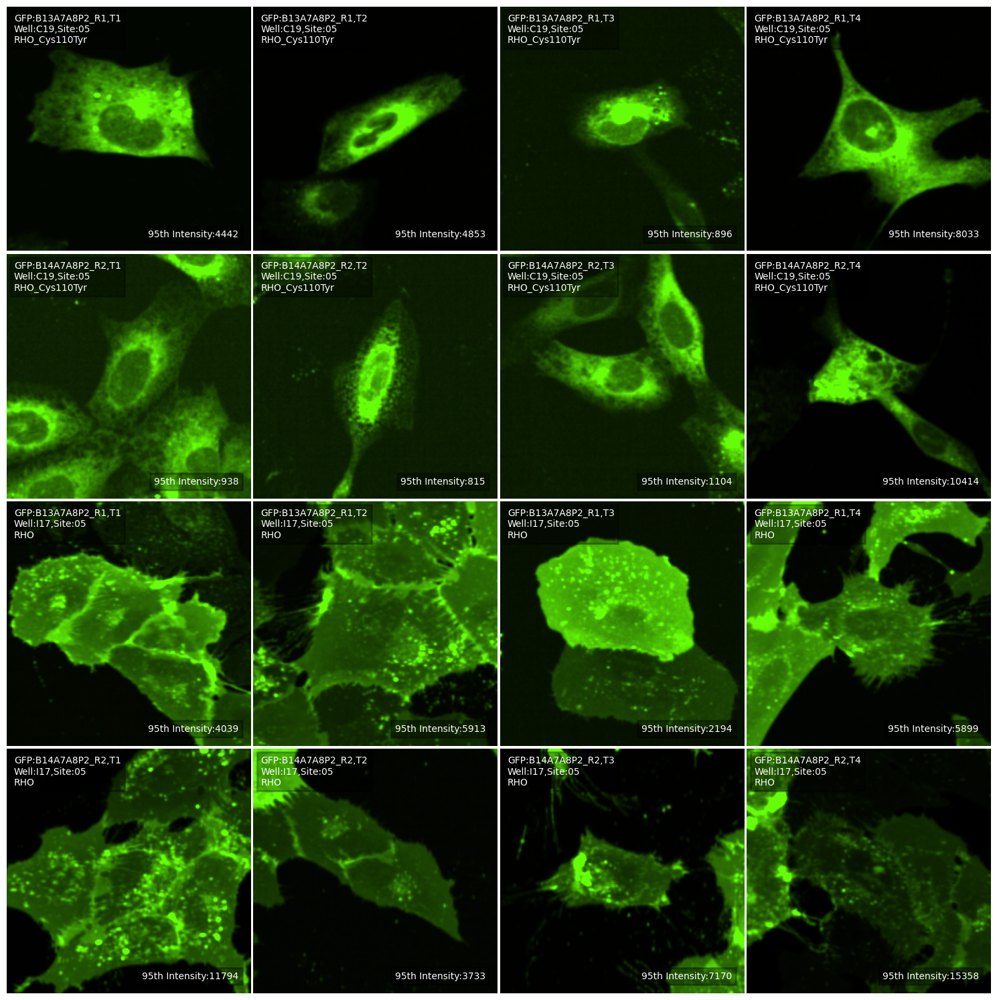

<Figure size 640x480 with 0 Axes>

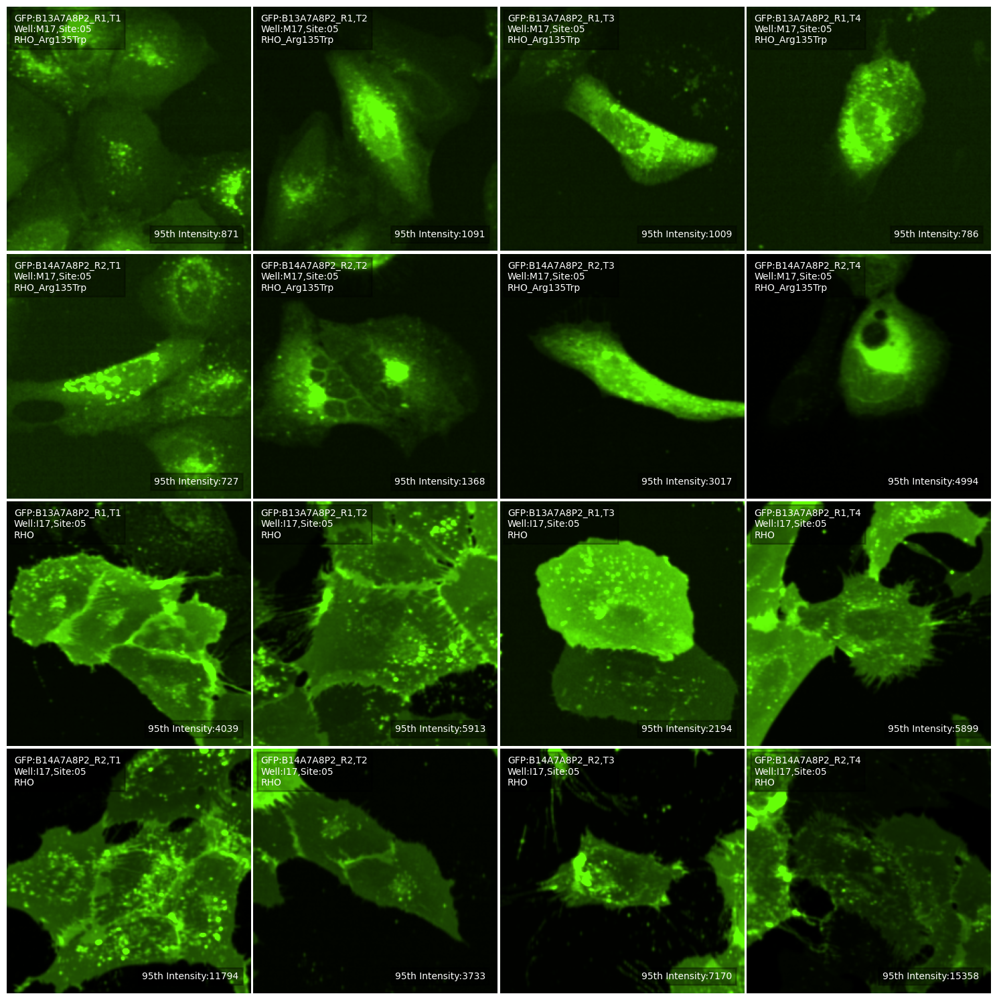

In [14]:
plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
                 "RHO_Cys110Tyr", "GFP", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
                 site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)

plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
                 "RHO_Arg135Trp", "GFP", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
                 site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)